In [1]:
library(tidyverse)
library(ggplot2)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


# Task 1 - Load DATA SET

In [2]:
# Load dataset
url <- "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-RP0321EN-SkillsNetwork/labs/datasets/seoul_bike_sharing.csv"
seoul_bike_sharing <- read_csv(url, col_types = cols(DATE = col_character()))

# Task 2 — Recast DATE as a Date

In [3]:
seoul_bike_sharing <- seoul_bike_sharing %>%
  mutate(DATE = as.Date(DATE, format = "%d/%m/%Y"))

# Verify
class(seoul_bike_sharing$DATE)

[1] "Date"

# Task 3 — Cast HOUR as Categorical

In [4]:
seoul_bike_sharing <- seoul_bike_sharing %>%
  mutate(HOUR = factor(HOUR, levels = 0:23, ordered = TRUE))

# Check structure
str(seoul_bike_sharing)

# Check no missing values
sum(is.na(seoul_bike_sharing))

tibble [8,465 × 14] (S3: tbl_df/tbl/data.frame)
 $ DATE                 : Date[1:8465], format: "2017-12-01" "2017-12-01" ...
 $ RENTED_BIKE_COUNT    : num [1:8465] 254 204 173 107 78 100 181 460 930 490 ...
 $ HOUR                 : Ord.factor w/ 24 levels "0"<"1"<"2"<"3"<..: 1 2 3 4 5 6 7 8 9 10 ...
 $ TEMPERATURE          : num [1:8465] -5.2 -5.5 -6 -6.2 -6 -6.4 -6.6 -7.4 -7.6 -6.5 ...
 $ HUMIDITY             : num [1:8465] 37 38 39 40 36 37 35 38 37 27 ...
 $ WIND_SPEED           : num [1:8465] 2.2 0.8 1 0.9 2.3 1.5 1.3 0.9 1.1 0.5 ...
 $ VISIBILITY           : num [1:8465] 2000 2000 2000 2000 2000 ...
 $ DEW_POINT_TEMPERATURE: num [1:8465] -17.6 -17.6 -17.7 -17.6 -18.6 -18.7 -19.5 -19.3 -19.8 -22.4 ...
 $ SOLAR_RADIATION      : num [1:8465] 0 0 0 0 0 0 0 0 0.01 0.23 ...
 $ RAINFALL             : num [1:8465] 0 0 0 0 0 0 0 0 0 0 ...
 $ SNOWFALL             : num [1:8465] 0 0 0 0 0 0 0 0 0 0 ...
 $ SEASONS              : chr [1:8465] "Winter" "Winter" "Winter" "Winter" ...
 $ HOLIDA

[1] 0

# Task 4 — Dataset Summary

In [5]:
summary(seoul_bike_sharing)

      DATE            RENTED_BIKE_COUNT      HOUR       TEMPERATURE    
 Min.   :2017-12-01   Min.   :   2.0    7      : 353   Min.   :-17.80  
 1st Qu.:2018-02-27   1st Qu.: 214.0    8      : 353   1st Qu.:  3.00  
 Median :2018-05-28   Median : 542.0    9      : 353   Median : 13.50  
 Mean   :2018-05-28   Mean   : 729.2    10     : 353   Mean   : 12.77  
 3rd Qu.:2018-08-24   3rd Qu.:1084.0    11     : 353   3rd Qu.: 22.70  
 Max.   :2018-11-30   Max.   :3556.0    12     : 353   Max.   : 39.40  
                                        (Other):6347                   
    HUMIDITY       WIND_SPEED      VISIBILITY   DEW_POINT_TEMPERATURE
 Min.   : 0.00   Min.   :0.000   Min.   :  27   Min.   :-30.600      
 1st Qu.:42.00   1st Qu.:0.900   1st Qu.: 935   1st Qu.: -5.100      
 Median :57.00   Median :1.500   Median :1690   Median :  4.700      
 Mean   :58.15   Mean   :1.726   Mean   :1434   Mean   :  3.945      
 3rd Qu.:74.00   3rd Qu.:2.300   3rd Qu.:2000   3rd Qu.: 15.200      
 Max

# Task 5 — How Many Holidays?

In [6]:
seoul_bike_sharing %>%
  filter(HOLIDAY == "Holiday") %>%
  nrow()

[1] 408

# Task 6 — Percentage of Records on Holiday

In [7]:
holiday_pct <- seoul_bike_sharing %>%
  summarize(
    total = n(),
    holidays = sum(HOLIDAY == "Holiday"),
    percentage = (holidays / total) * 100
  )
print(holiday_pct)

# A tibble: 1 × 3
  total holidays percentage
  <int>    <int>      <dbl>
1  8465      408       4.82


# Task 7 — Expected Records for Full Year

In [8]:
# 365 days x 24 hours per day
expected_records <- 365 * 24
print(expected_records)

# Compare with actual
nrow(seoul_bike_sharing)

[1] 8760


[1] 8465

# Task 8 — Records for Functioning Days

In [9]:
seoul_bike_sharing %>%
  count(FUNCTIONING_DAY)

FUNCTIONING_DAY,n
<chr>,<int>
Yes,8465


# Task 9 — Seasonal Rainfall and Snowfall

In [10]:
library(dplyr)

seoul_bike_sharing %>%
  group_by(SEASONS) %>%
  summarize(
    TOTAL_RAINFALL = sum(RAINFALL, na.rm = TRUE),
    TOTAL_SNOWFALL = sum(SNOWFALL, na.rm = TRUE)
  )

SEASONS,TOTAL_RAINFALL,TOTAL_SNOWFALL
<chr>,<dbl>,<dbl>
Autumn,227.9,123.0
Spring,403.8,0.0
Summer,559.7,0.0
Winter,70.9,534.6


# Task 10 — Scatter Plot of Bike Count vs Date

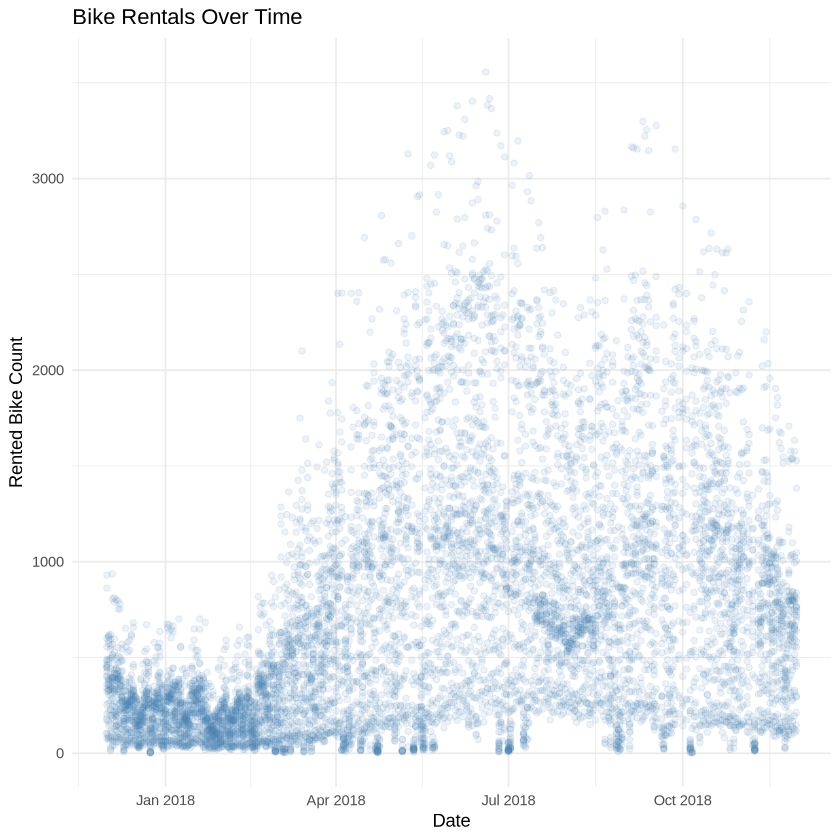

In [11]:
ggplot(seoul_bike_sharing, 
       aes(x = DATE, y = RENTED_BIKE_COUNT)) +
  geom_point(alpha = 0.1, color = "steelblue") +
  labs(
    title = "Bike Rentals Over Time",
    x = "Date",
    y = "Rented Bike Count"
  ) +
  theme_minimal()

# Task 11 — Same Plot with HOUR as Colour

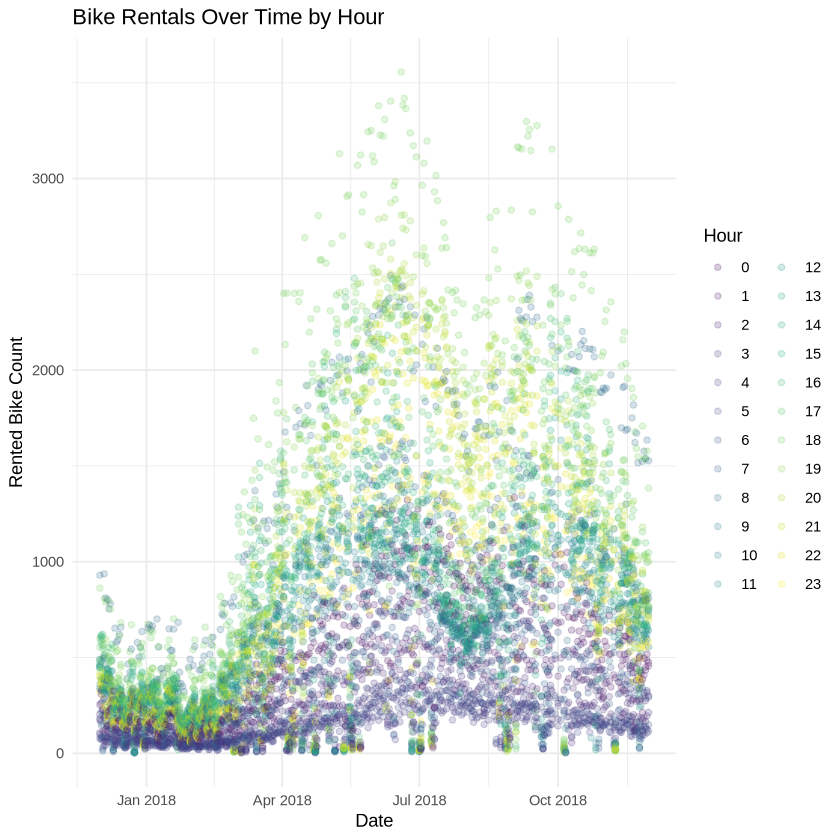

In [12]:
ggplot(seoul_bike_sharing,
       aes(x = DATE, y = RENTED_BIKE_COUNT, colour = HOUR)) +
  geom_point(alpha = 0.2) +
  labs(
    title = "Bike Rentals Over Time by Hour",
    x = "Date",
    y = "Rented Bike Count",
    colour = "Hour"
  ) +
  theme_minimal()

# Task 12 — Histogram with Kernel Density Curve

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


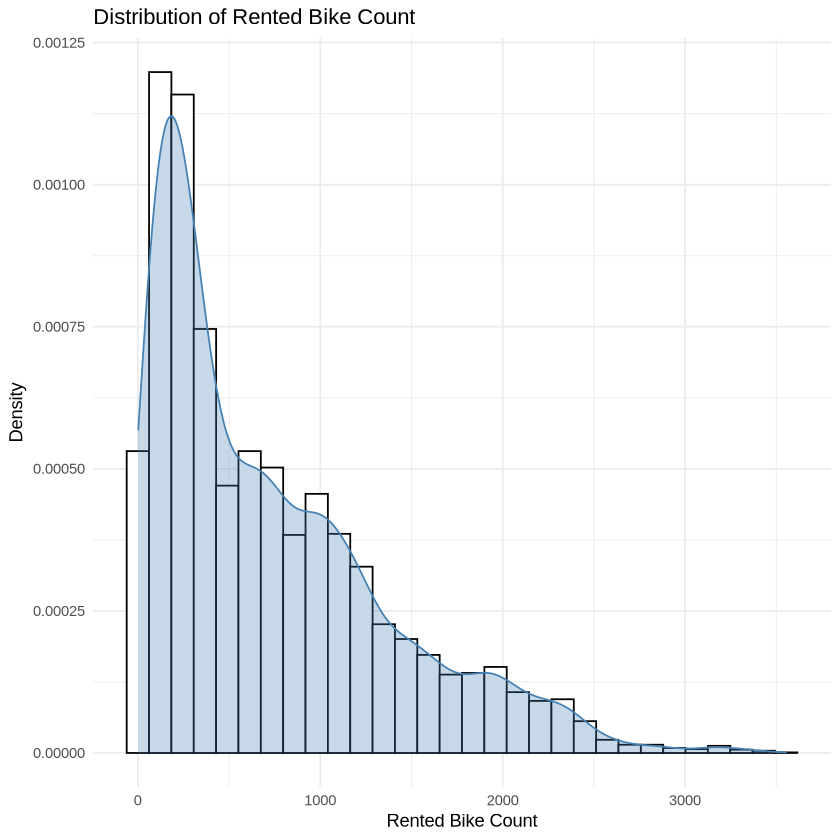

In [13]:
ggplot(seoul_bike_sharing, 
       aes(x = RENTED_BIKE_COUNT)) +
  geom_histogram(aes(y = ..density..),
                 bins = 30,
                 colour = "black",
                 fill = "white") +
  geom_density(colour = "steelblue",
               fill = "steelblue",
               alpha = 0.3) +
  labs(
    title = "Distribution of Rented Bike Count",
    x = "Rented Bike Count",
    y = "Density"
  ) +
  theme_minimal()

# Task 13 — Scatter Plot by Season with Facets

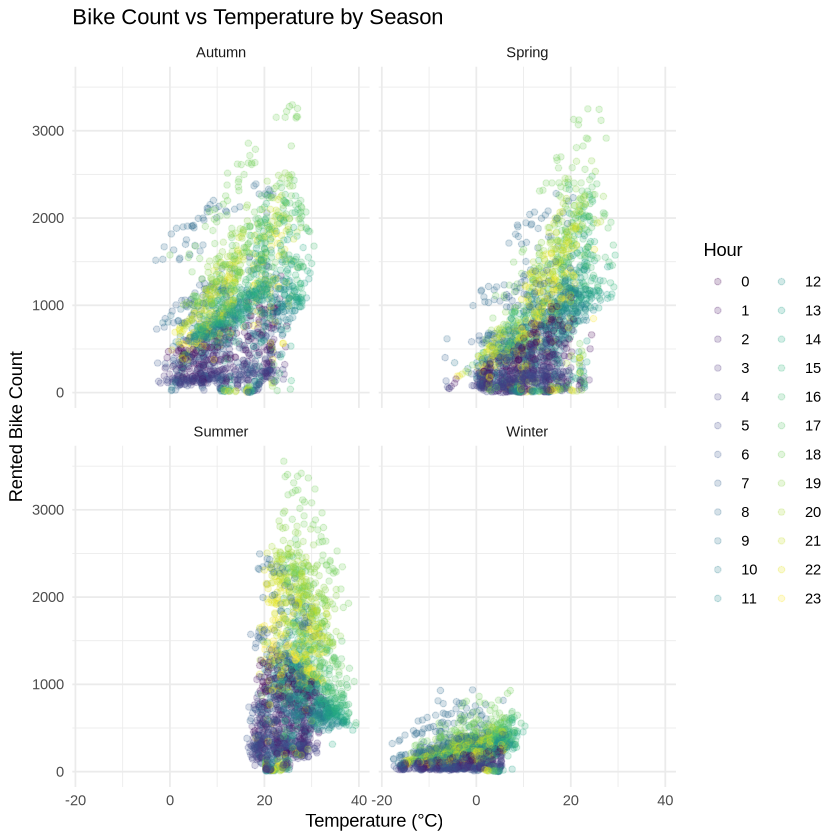

In [14]:
ggplot(seoul_bike_sharing,
       aes(x = TEMPERATURE, 
           y = RENTED_BIKE_COUNT, 
           colour = HOUR)) +
  geom_point(alpha = 0.2) +
  facet_wrap(~SEASONS) +
  labs(
    title = "Bike Count vs Temperature by Season",
    x = "Temperature (°C)",
    y = "Rented Bike Count",
    colour = "Hour"
  ) +
  theme_minimal()

# Task 14 — Boxplots by Hour and Season

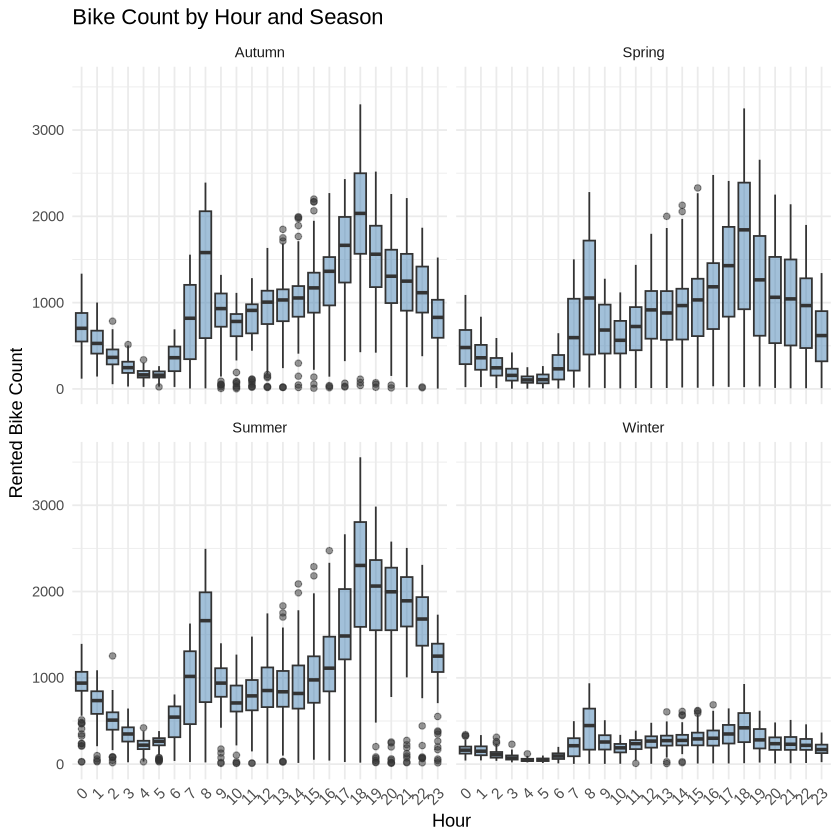

In [15]:
ggplot(seoul_bike_sharing,
       aes(x = HOUR, y = RENTED_BIKE_COUNT)) +
  geom_boxplot(fill = "steelblue", alpha = 0.5) +
  facet_wrap(~SEASONS) +
  labs(
    title = "Bike Count by Hour and Season",
    x = "Hour",
    y = "Rented Bike Count"
  ) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Task 15 — Daily Rainfall and Snowfall


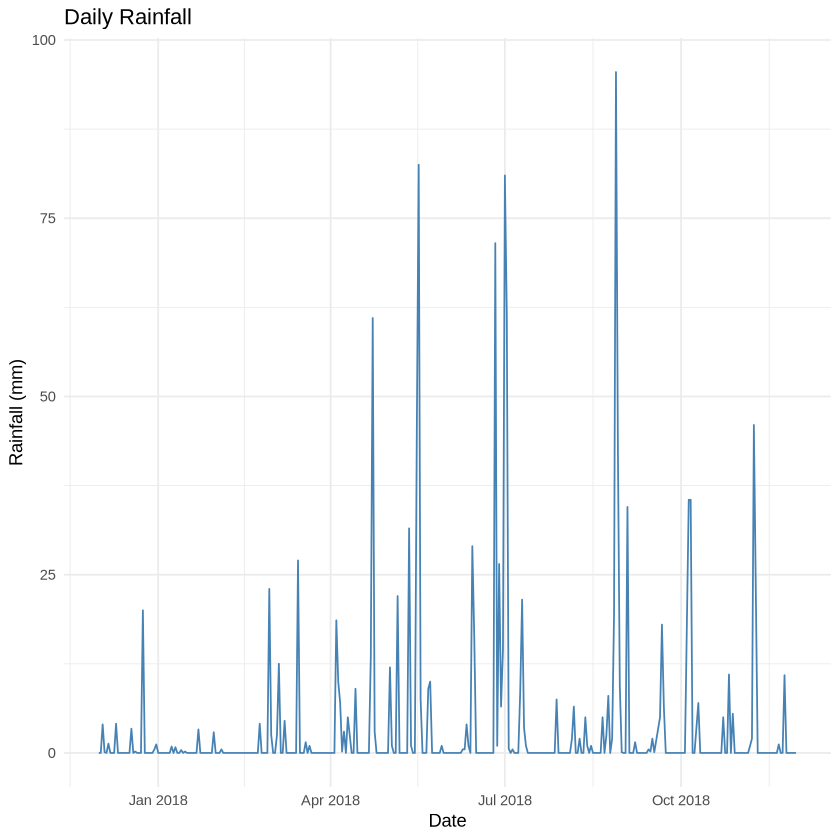

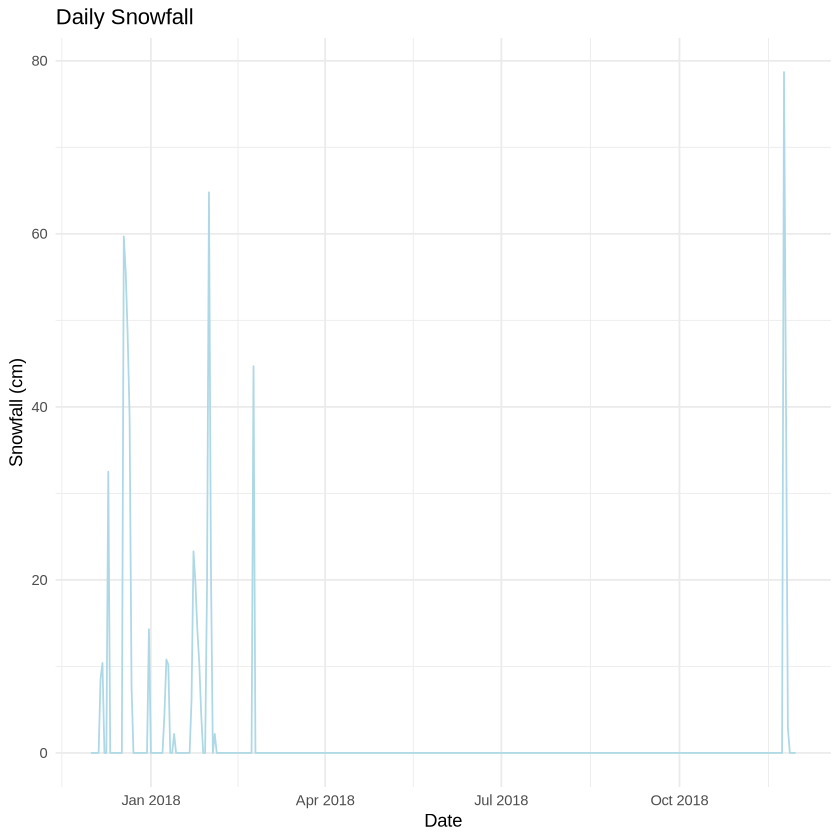

In [16]:
daily_precipitation <- seoul_bike_sharing %>%
  group_by(DATE) %>%
  summarize(
    TOTAL_RAINFALL = sum(RAINFALL, na.rm = TRUE),
    TOTAL_SNOWFALL = sum(SNOWFALL, na.rm = TRUE)
  )

# Plot rainfall
ggplot(daily_precipitation, aes(x = DATE, y = TOTAL_RAINFALL)) +
  geom_line(colour = "steelblue") +
  labs(title = "Daily Rainfall", x = "Date", y = "Rainfall (mm)") +
  theme_minimal()

# Plot snowfall
ggplot(daily_precipitation, aes(x = DATE, y = TOTAL_SNOWFALL)) +
  geom_line(colour = "lightblue") +
  labs(title = "Daily Snowfall", x = "Date", y = "Snowfall (cm)") +
  theme_minimal()

# Task 16 — Days with Snowfall

In [18]:
daily_precipitation %>%
  filter(TOTAL_SNOWFALL > 0) %>%
  nrow()

[1] 27